## Intro
Some code was taken from :

https://github.com/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb


https://github.com/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb


https://github.com/openai/CLIP

To run code, just run cells

Actualle, mask is found with find_mask_with_grid and find_mask_with_generator

## Installs

In [2]:
!pip install gdown

In [5]:
!gdown https://drive.google.com/uc?id=1hcGkpo39lp6PuinYJctipuCedJuoLxrz
# !unzip /content/data.zip -d ./scannet_data
!pip install git+https://github.com/openai/CLIP.git
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install opencv-python pycocotools matplotlib onnxruntime onnx
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

Downloading...
From (original): https://drive.google.com/uc?id=1hcGkpo39lp6PuinYJctipuCedJuoLxrz
From (redirected): https://drive.google.com/uc?id=1hcGkpo39lp6PuinYJctipuCedJuoLxrz&confirm=t&uuid=cc0f2424-efd6-4366-aeaf-5ce3c3850b26
To: /kaggle/working/data.zip
100%|████████████████████████████████████████| 170M/170M [00:09<00:00, 17.2MB/s]
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-3yzg8oyn
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-3yzg8oyn
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.7 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=c377d72d3c142210bc01e2a64cf1ea0f3490896bbe5d0e1382d9e2ef9e151adc
  Stored in directory: /tmp/pip-ephem-wheel-cache-770qqtfu/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b

In [6]:
!unzip ./data.zip -d ./scannet_data

Archive:  ./data.zip
   creating: ./scannet_data/gt_semantic_2d/
   creating: ./scannet_data/gt_semantic_2d/render_semantic/
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05827.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05828.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05829.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05830.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05831.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05832.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05833.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05834.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05835.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05836.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DSC05837.JPG  
  inflating: ./scannet_data/gt_semantic_2d/render_semantic/DS

## Imports

In [7]:
from segment_anything import SamPredictor, sam_model_registry
from tqdm import tqdm 
import cv2
import os
from PIL import Image
import numpy as np

from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
import clip
import torch


import matplotlib.pyplot as plt

In [8]:
np.set_printoptions(suppress=True)
device = torch.device("cuda") if torch.cuda.is_available() else "cpu"
# device = mps_device

## Preloads

In [9]:


# Path to data
images_path = "./scannet_data/images_0a7cc/"
masks_path = "./scannet_data/gt_semantic_2d/render_semantic_npy"

# Load every 10th image
image_files = sorted(os.listdir(images_path))[::10]
mask_files = sorted(os.listdir(masks_path))[::10]
print(len(image_files))
print(len(mask_files))

35
35


In [10]:


# Load SAM
sam_checkpoint = "sam_vit_h_4b8939.pth"
sam_model = sam_model_registry["vit_h"](checkpoint=sam_checkpoint)
sam_predictor = SamPredictor(sam_model)
mask_generator = SamAutomaticMaskGenerator(sam_model)

sam_model = sam_model.to(device)

clip_model, preprocess = clip.load("ViT-B/32", device=device)

/opt/conda/lib/python3.10/site-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)
100%|████████████████████

## Utils

In [11]:
def show_mask(mask, ax, random_color=False, color=[30/255, 144/255, 255/255, 0.6]):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array(color)
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
def crop_zeros(dat):
  true_points = np.argwhere(dat)
# take the smallest points and use them as the top left of your crop
  top_left = true_points.min(axis=0)
  # take the largest points and use them as the bottom right of your crop
  bottom_right = true_points.max(axis=0)
  out = dat[top_left[0]:bottom_right[0]+1,  # plus 1 because slice isn't
            top_left[1]:bottom_right[1]+1, :]
  return out

In [12]:
def generate_point_grid(image_shape, step_size):
    step_size *= 2
    yW, xW = image_shape[:2]

    xM, yM = np.arange(step_size, xW, step_size), np.arange(step_size, yW, step_size)
    xM, yM = np.meshgrid(xM, yM)
    M = np.array([xM.ravel(), yM.ravel()])
    
    xM, yM = np.arange(step_size//2, xW, step_size), np.arange(step_size//2, yW, step_size)
    xM, yM = np.meshgrid(xM, yM)
    M2 = np.array([xM.ravel(), yM.ravel()])
    
    M = (np.concatenate([M, M2], axis=-1))
    

    M = M.transpose(1, 0)
    return M

def generate_random_grid(image_shape, N):
    
    return np.random.uniform((0, 0), (image_shape[1], image_shape[0]), size=(N, 2))


In [13]:
def get_instance_by_mask(image, mask):
    return image*mask[:, :, None]

In [14]:

def trim_zeros_3channel(image, idx=None):


    non_zero_mask = np.any(image != 0, axis=-1)


    row_nonzero = np.any(non_zero_mask, axis=1)
    col_nonzero = np.any(non_zero_mask, axis=0)

    if not np.any(row_nonzero) or not np.any(col_nonzero):
        print(idx)

        return np.zeros((1, 1))


    row_start, row_end = np.where(row_nonzero)[0][[0, -1]]
    col_start, col_end = np.where(col_nonzero)[0][[0, -1]]


    trimmed_image = image[row_start:row_end+1, col_start:col_end+1, :]
    return trimmed_image

In [15]:
def return_masks_w_best_similarities(similarities, idx, masks, threshold):
    similarities = np.array(similarities)
    match_similarities = similarities[:, 0]>threshold
    count = match_similarities.sum()
    match_idx = np.array(idx)[match_similarities]
    match_masks = np.array([masks[i] for i in match_idx])
    
    return count, similarities, match_idx, match_masks

def combine_matched_mask(masks):
    return np.sum(masks, axis=0)>0
    

In [16]:
def get_embedding_by_instance(instance_trim):
    return clip_model.encode_image(preprocess(Image.fromarray(instance_trim)).unsqueeze(0).to(device))

In [17]:
def split_array_by_unique(a:np.ndarray):
    u = np.unique(a)
    slices = {v: a == v for v in u}
    return slices

In [18]:
def segment_image(image):
    sam_predictor.set_image(image)
    masks, _, _ = sam_predictor.predict()
    return masks

In [21]:
def combine_masks(masks):
    combined_mask = np.zeros_like(masks[0], dtype=bool)
    for mask in masks:
        combined_mask = np.logical_or(combined_mask, mask)
    return combined_mask

In [20]:
def compute_iou(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    return intersection / union if union != 0 else 1

In [19]:


def visualize(image, pred_mask, gt_mask):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask, cmap="viridis")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(gt_mask, cmap="viridis")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.show()

## Explore the dataset

In [22]:
!ls ./scannet_data/gt_semantic_2d/

render_semantic  render_semantic_npy


In [22]:
im_id = 2
image_file = image_files[im_id]
gt_mask = np.load(os.path.join(masks_path, mask_files[im_id]))
print(image_file)

DSC05847.JPG


(811, 1440, 3)
(811, 1440)


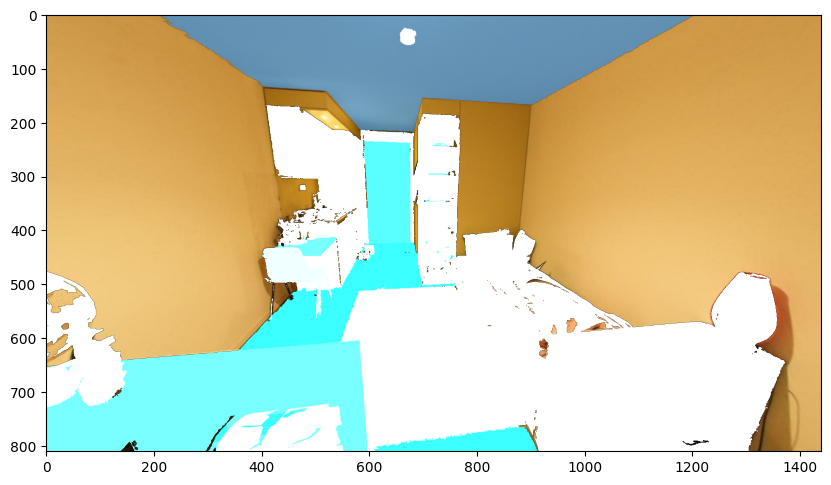

In [23]:
# image = np.array(Image.open(os.path.join(images_path, image_file)))
image = cv2.imread(os.path.join(images_path, image_file))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# print(os.path.join(masks_path, mask_files[i]), mask_files[i])
 # Adjust if using JPG masks
print(image.shape)

print(gt_mask.shape)
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(gt_mask, plt.gca())
plt.axis('on')
plt.show()

In [24]:
masks = split_array_by_unique(gt_mask)
masks.keys()

dict_keys([-100, 0, 1, 2, 3, 4, 8, 10, 18, 19, 25, 28, 30, 36, 49, 54, 60, 68, 70, 98, 105, 106, 118, 122, 166, 204, 243, 299, 301, 342, 360, 368, 555, 707, 1637, 1651])

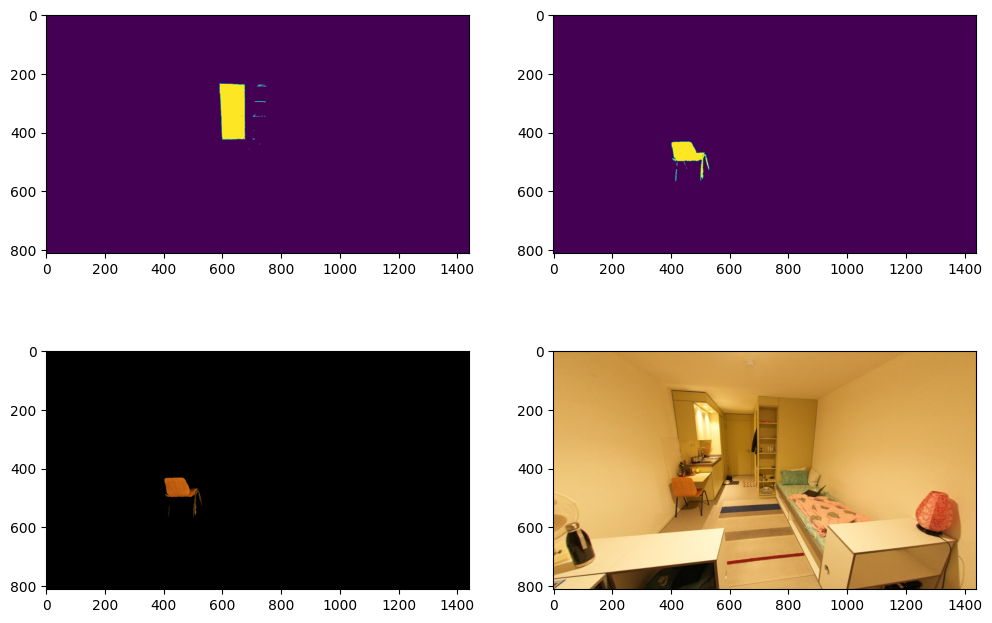

In [25]:
chair_mask = masks[8]
door_mask = masks[3]
chair, door = image * chair_mask[:, :, None], image * door_mask[:, :, None]

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(door_mask)

plt.subplot(2, 2, 2)
plt.imshow(chair_mask)

plt.subplot(2, 2, 3)
plt.imshow(chair)

plt.subplot(2, 2, 4)
plt.imshow(image)




In [26]:
#create long image
image_2 = np.concatenate([image, image[:, ::-1, :]], axis=1)
image = image_2

In [27]:
gt_mask_2 = np.concatenate([gt_mask, gt_mask[:, ::-1]], axis=1)==8

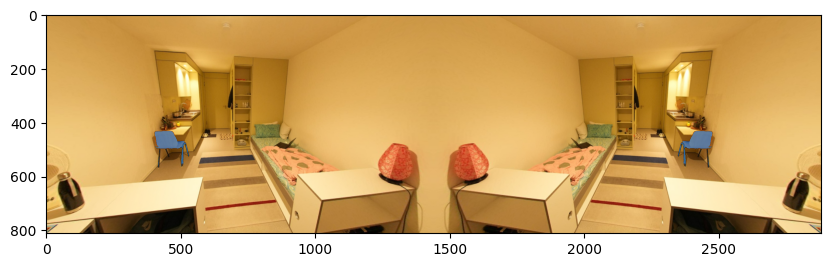

In [28]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(gt_mask_2, plt.gca())

In [29]:
sam_predictor.set_image(image)

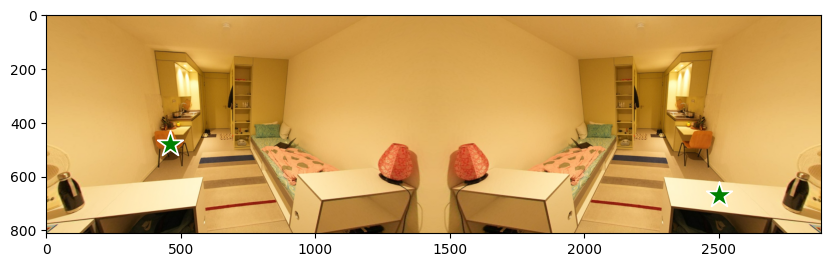

In [30]:
#manually target the chair and table
plt.figure(figsize=(10, 8))
input_point = np.array([[460, 480], [2500, 670]])
input_label = np.array([1, 1])

plt.imshow(image)
show_points(input_point, input_label, plt.gca())

In [31]:
mask_chair, _, _ = sam_predictor.predict(input_point[0:1], np.ones(1))
mask_table, _, _ = sam_predictor.predict(input_point[1:], np.ones(1))
print(mask_chair.shape)

(3, 811, 2880)


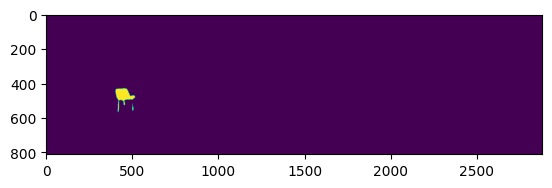

In [32]:
plt.imshow(mask_chair[1])

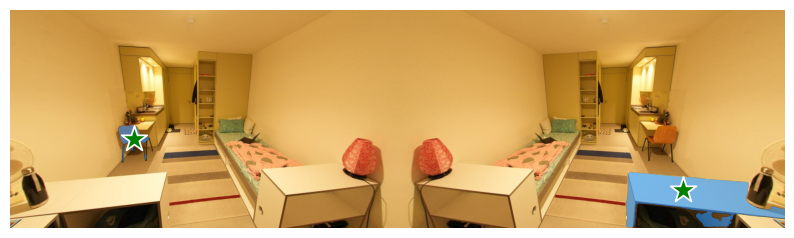

In [33]:
plt.figure(figsize=(10, 8))
plt.imshow(image)
plt.axis("off")
show_points(input_point, input_label, plt.gca())
show_mask(mask_chair[1], plt.gca())
show_mask(mask_table[1], plt.gca())

In [34]:
#get object instance
chair_instance = get_instance_by_mask(image, mask_chair[1])
table_instance =  get_instance_by_mask(image, mask_table[1])

In [35]:
trimmed_chair = trim_zeros_3channel(chair_instance)
trimmed_table= trim_zeros_3channel(table_instance)

/tmp/ipykernel_23/1016379993.py:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


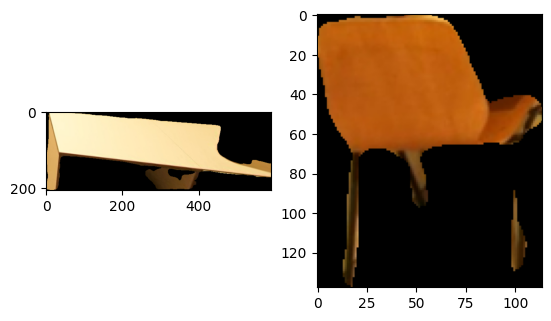

In [36]:
plt.axis("off")
plt.subplot(1, 2, 1)
plt.imshow(trimmed_table)
plt.subplot(1, 2, 2)
plt.imshow(trimmed_chair)

In [278]:
mask_embedding_chair = clip_model.encode_image(preprocess(Image.fromarray(chair_instance)).unsqueeze(0).to(device))
mask_embedding_chair_trimmed = clip_model.encode_image(preprocess(Image.fromarray(trimmed_chair)).unsqueeze(0).to(device))
mask_embedding_table = clip_model.encode_image(preprocess(Image.fromarray(table_instance)).unsqueeze(0).to(device))
mask_embedding_table_trimmed = clip_model.encode_image(preprocess(Image.fromarray(trimmed_table)).unsqueeze(0).to(device))

In [115]:
door_prompt = "door"
table_prompt = "table"
chair_prompt = "chair"

In [116]:
prompt_embedding_door = clip_model.encode_text(clip.tokenize(door_prompt).to(device))
prompt_embedding_table = clip_model.encode_text(clip.tokenize(table_prompt).to(device))
prompt_embedding_chair = clip_model.encode_text(clip.tokenize(chair_prompt).to(device))

In [280]:
print("Same object chair, not trimmed", torch.cosine_similarity(prompt_embedding_chair, mask_embedding_chair).item())
print("Same object table, not trimmed", torch.cosine_similarity(prompt_embedding_table, mask_embedding_table).item())
print()

print("Same object, trimmed chair", torch.cosine_similarity(prompt_embedding_chair, mask_embedding_chair_trimmed).item())
print("Same object, trimmed table", torch.cosine_similarity(prompt_embedding_table, mask_embedding_table_trimmed).item())

print()
print("Different object, not trimmed", torch.cosine_similarity(prompt_embedding_door, mask_embedding_chair).item())
print("Different object, trimmed", torch.cosine_similarity(prompt_embedding_door, mask_embedding_chair_trimmed).item())

Same object chair, not trimmed 0.250244140625
Same object table, not trimmed 0.251708984375

Same object, trimmed chair 0.30908203125
Same object, trimmed table 0.285400390625

Different object, not trimmed 0.254150390625
Different object, trimmed 0.2469482421875


In [42]:
image.shape


(811, 2880, 3)

## Actual solution

### Find mask with grid

#### Rectangular grid

(456, 2)


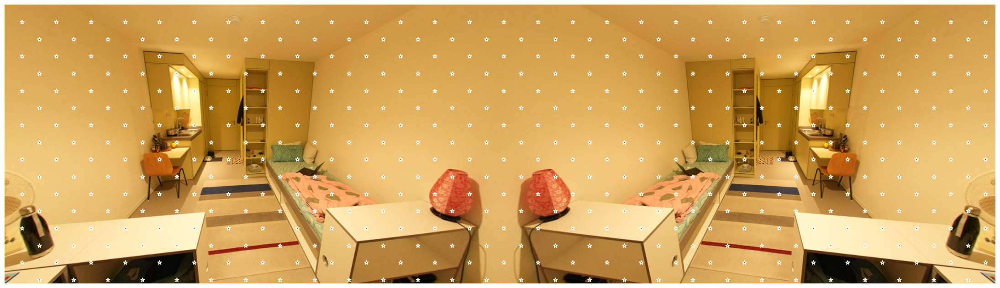

In [43]:
M = generate_point_grid(image.shape, 50)
print(M.shape)

plt.figure(figsize=(28, 8))
plt.axis("off")
plt.imshow(image)

show_points(M, np.ones(len(M)), plt.gca(), 40)

#### Uniform grid

(600, 2)


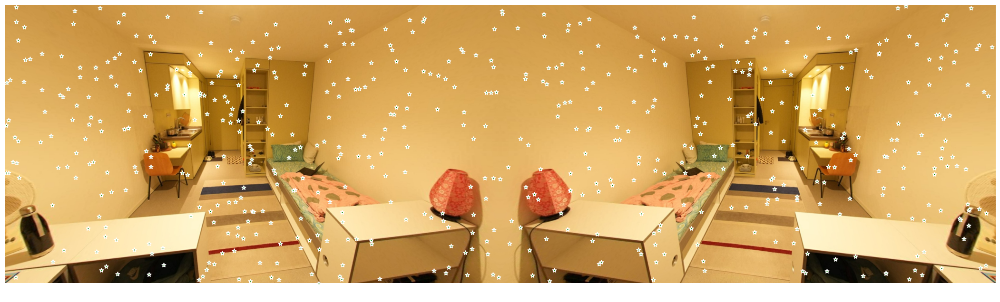

In [44]:
n = 600
random_grid = generate_random_grid(image.shape, n)
print(random_grid.shape)

plt.figure(figsize=(28, 8))
plt.axis("off")
plt.imshow(image)

show_points(random_grid, np.ones(n), plt.gca(), 40)

In [208]:
def find_mask_with_grid(n, grid_fn, mask_sz=1):
    def internal(image, text_emb, threshold=0.3):
        similarities = []
        idx = []
        masks = [] 
        M = grid_fn(image.shape, n)
        sam_predictor.set_image(image)
        for i in range(len(M)):
            point = M[i:i+1]
            label = np.array([1])
        
            mask, _, _ = sam_predictor.predict(point, label, multimask_output=True)
        
            mask = mask[mask_sz, :, :]
            instance = mask[:, :, None]*image
            instance = trim_zeros_3channel(instance, i)
            emb = get_embedding_by_instance(instance)
            similarity = (torch.cosine_similarity(emb, text_emb).item())
            
            similarities.append((similarity, i))
            idx.append(i)
            masks.append(mask)
        cnt, match_similarities ,match_idx , match_masks = return_masks_w_best_similarities(similarities, idx, masks, threshold)
        # print(cnt)
        if cnt == 0:
            return np.zeros_like(image)[:, :, 0] 
        match_mask = combine_matched_mask(match_masks)
        return match_mask
    return internal
    



In [46]:
text = 'chair'
text_emb = clip_model.encode_text(clip.tokenize(text).to(device))

In [47]:
match_mask = find_mask_with_grid(50, generate_point_grid)(image, text_emb)

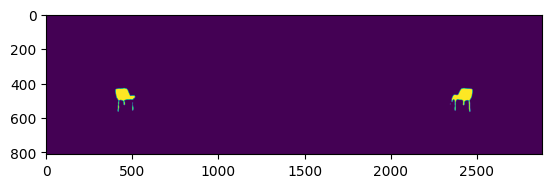

In [48]:
plt.imshow(match_mask)

In [299]:
# match_similarities ,match_idx , match_masks = return_masks_w_best_similarities(similarities, idx, masks, 0.3)

In [302]:
# match_mask = np.sum(match_masks, axis=0)>0

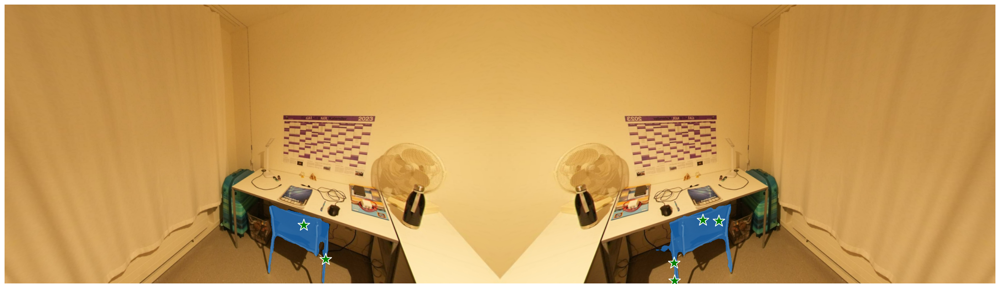

In [303]:
# plt.figure(figsize=(28, 8))
# plt.axis("off")
# plt.imshow(image)
# show_mask(match_mask, plt.gca())
# show_points(M[match_idx], np.ones(len(match_idx)), plt.gca())

In [93]:
# def show_anns(anns):
#     if len(anns) == 0:
#         return
#     sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
#     ax = plt.gca()
#     ax.set_autoscale_on(False)

#     img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
#     img[:,:,3] = 0
#     for ann in sorted_anns:
#         m = ann['segmentation']
#         color_mask = np.concatenate([np.random.random(3), [0.35]])
#         img[m] = color_mask
#     ax.imshow(img)

### Find mask with Mask Generator

In [49]:
mask_generator = SamAutomaticMaskGenerator(sam_model, 
    points_per_side=60,
    pred_iou_thresh=0.95,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2
    )
# masks_anno = mask_generator.generate(image)

In [50]:
def find_mask_with_generator(image, text_emb, threshold=0.3):
    masks_anno = mask_generator.generate(image)
    similarities = []
    idx = []
    masks = [] 
    
    for i, anno in enumerate(masks_anno):
        bin_mask = anno['segmentation']
        instance = image * bin_mask[:, :, None]
        instance_trim = trim_zeros_3channel(instance, i)
    
        emb = get_embedding_by_instance(instance_trim)
        similarity = (torch.cosine_similarity(emb, text_emb).item())
        
        similarities.append((similarity, i))
        idx.append(i)
        masks.append(bin_mask)
        
    cnt, s, ind, m = return_masks_w_best_similarities(similarities, idx, masks, threshold)
    # print(cnt)
    if cnt == 0:
        return np.zeros_like(image)[:, :, 0] 
    mg_mask = combine_matched_mask(m)
    return mg_mask
    


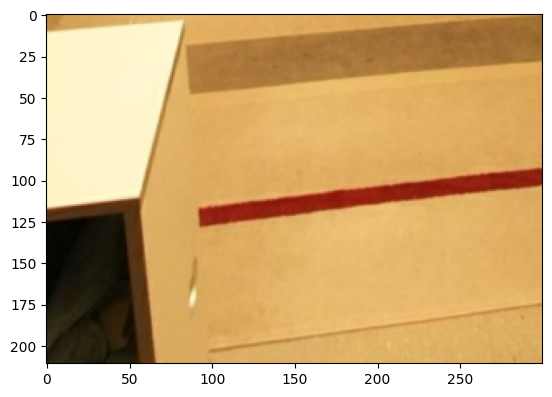

In [51]:
empty_image = image[600:1000, 500:800]
plt.imshow(empty_image)

In [52]:
em_mask = find_mask_with_generator(empty_image, text_emb)

(211, 300) (211, 300, 3)
0.0


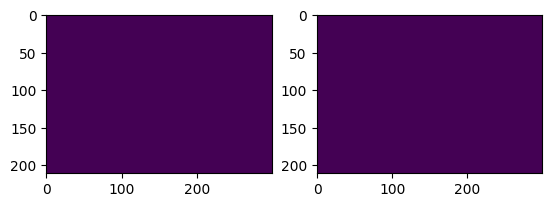

In [53]:
print(em_mask.shape, empty_image.shape)
print(compute_iou(gt_mask[600:1000, 500:800], em_mask))
plt.subplot(1, 2, 1)
plt.imshow(em_mask)
plt.subplot(1, 2, 2)
plt.imshow(gt_mask_2[600:1000, 500:800])

In [54]:
mg_mask = find_mask_with_generator(image, text_emb)

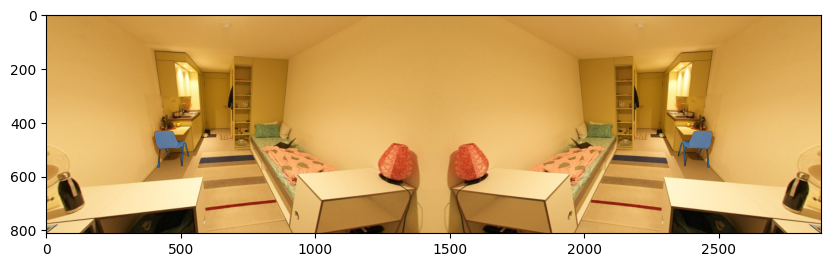

In [55]:
plt.figure(figsize=(10, 6))
plt.imshow(image)

show_mask(mg_mask, plt.gca())

## Evaluator

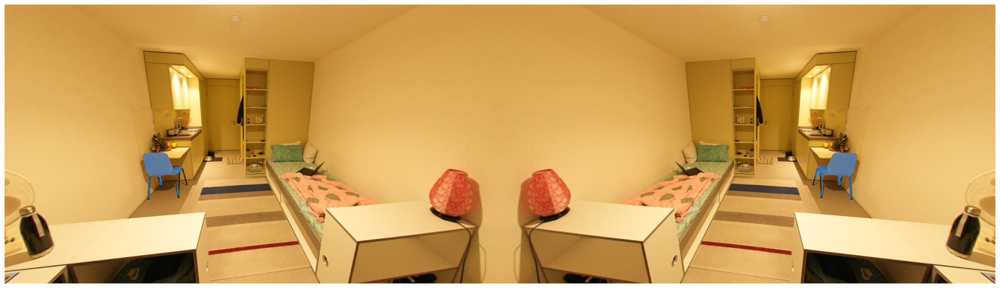

In [258]:
plt.figure(figsize=(28, 8))
plt.axis("off")
plt.imshow(image)
show_mask(match_mask, plt.gca())
plt.show()

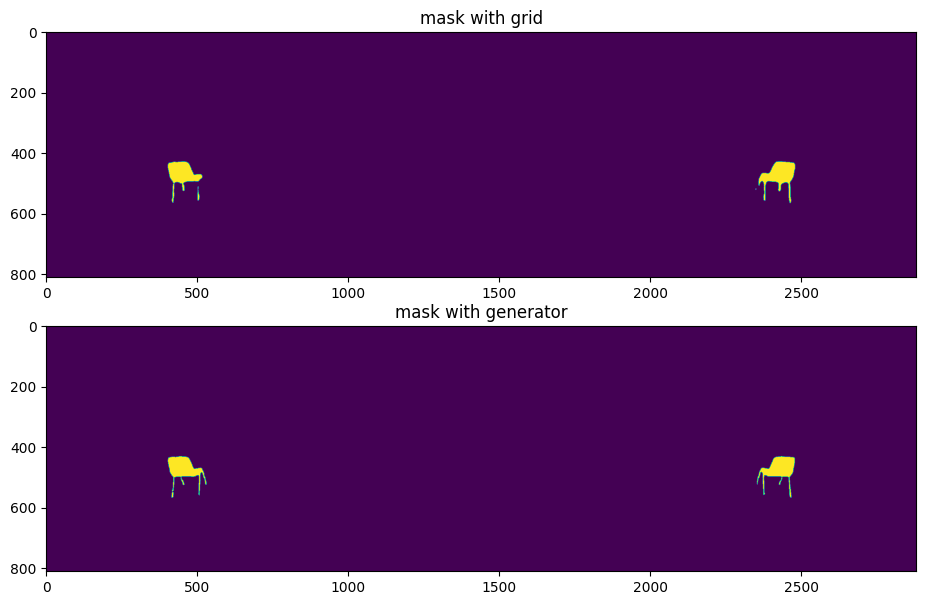

In [259]:
plt.figure(figsize=(14, 7))
plt.subplot(2, 1, 1)
plt.title("mask with grid")
plt.imshow(match_mask)

plt.subplot(2, 1, 2)
plt.title("mask with generator")
plt.imshow(mg_mask)

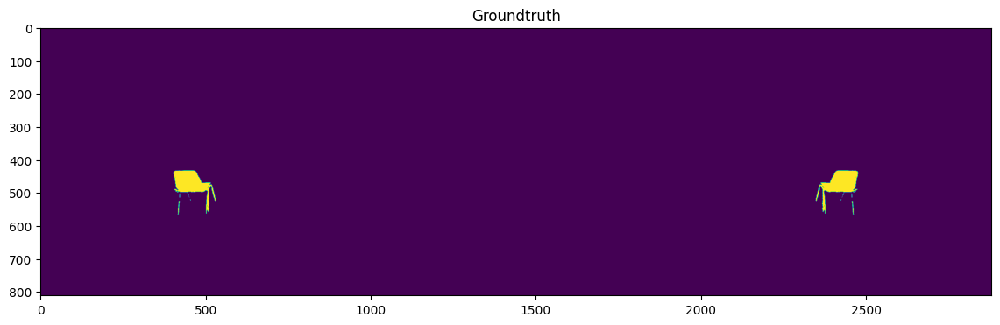

In [260]:

plt.figure(figsize=(14, 7))
plt.title('Groundtruth')
plt.imshow(gt_mask_2)

In [261]:
grid_iou = compute_iou(match_mask, gt_mask_2)
print(f"iou between grid and GT:{grid_iou:.2}")

iou between grid and GT:0.77


In [262]:
grid_iou = compute_iou(mg_mask, gt_mask_2)
print(f"iou between generator and GT:{grid_iou:.2}")

iou between generator and GT:0.87


## Evaluate on Dataset

In [74]:
text = 'chair'
text_emb = clip_model.encode_text(clip.tokenize(text).to(device))

In [128]:
def evaluate_mask_finder(image_files, finder_func, text_emb=text_emb, class_index=8, threshold=0.3):
    iou_s = []
    iou_s_present = []
    for im_id in tqdm(range(len(image_files))):
        
        image_file = image_files[im_id]

        image = cv2.imread(os.path.join(images_path, image_file))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        gt_mask_all = np.load(os.path.join(masks_path, mask_files[im_id]))

        gt_mask = (gt_mask_all==class_index)
        
        mg_mask = finder_func(image, text_emb, threshold)
        iou_s.append(compute_iou(mg_mask, gt_mask))
        if gt_mask.sum() > 0:
            iou_s_present.append([iou_s[-1], im_id])
            
        # return (image, mg_mask, iou_s, gt_mask)
        
    return np.mean(iou_s), iou_s_present
        

In [110]:
#Run generator with threshold=0.28
mIOU_generator, present_ious_generator = evaluate_mask_finder(image_files, find_mask_with_generator, threshold=0.28)

100%|██████████| 35/35 [29:58<00:00, 51.40s/it]


In [292]:
print(f"mean IOU with mask_generator {mIOU_generator:.3f}")

mean IOU with mask_generator 0.652


In [291]:
present_ious_generator_np = np.array(present_ious_generator)
np.save("generator_028.npy", present_ious_generator_np)
print(f"Mask generator,  threshold 0.28\nmean={mIOU_generator:.3f}, mean on images w chair={present_ious_generator_np.mean(axis=0)[0]:.3f}")

Mask generator,  threshold 0.28
mean=0.652, mean on images w chair=0.388


In [294]:
mIOU_generator30, present_ious_generator30 = evaluate_mask_finder(image_files, find_mask_with_generator, threshold=0.3)

100%|██████████| 35/35 [30:45<00:00, 52.72s/it]


In [300]:
present_ious_generator_np30 = np.array(present_ious_generator30)
np.save("generator_030.npy", present_ious_generator_np30)
print(f"Mask generator,  threshold 0.3\nmean={mIOU_generator30:.3f}, mean on images w chair={present_ious_generator_np30.mean(axis=0)[0]:.3f}")

Mask generator,  threshold 0.3
mean=0.693, mean on images w chair=0.351


In [195]:
#rectangular grid, step 30
mIOU_grid_step30, present_ious_grid_step30 = evaluate_mask_finder(image_files, find_mask_with_grid(30, generate_point_grid))

100%|██████████| 35/35 [24:20<00:00, 41.72s/it]


In [288]:
present_ious_grid_step30 = np.array(present_ious_grid_step30)
print(f"Rectangular grid,  step 50\nmean={mIOU_grid_step30:.3f}, mean on images w chair={present_ious_grid_step30.mean(axis=0)[0]:.3f}")

Rectangular grid,  step 50
mean=0.724, mean on images w chair=0.423


In [198]:
np.save("present_ious_grid_step30.npy", present_ious_grid_step30)

In [185]:
#rectangular grid, step 30
mIOU_grid_step50, present_ious_grid_step50 = evaluate_mask_finder(image_files, find_mask_with_grid(50, generate_point_grid))

100%|██████████| 35/35 [09:24<00:00, 16.14s/it]


In [287]:
present_ious_grid_step50 = np.array(present_ious_grid_step50)
# print(mIOU_grid_step50, present_ious_grid_step50.mean(axis=0)[0])
print(f"Rectangular grid,  step 50\nmean={mIOU_grid_step50:.3f}, mean on images w chair={present_ious_grid_step50.mean(axis=0)[0]:.3f}")

Rectangular grid,  step 50
mean=0.706, mean on images w chair=0.381


In [197]:
np.save("present_ious_grid_step50.npy", present_ious_grid_step50)

In [129]:
#Uniform grid, 600 samples
mIOU_grid_600, present_ious_grid_600 = evaluate_mask_finder(image_files, find_mask_with_grid(600, generate_random_grid))

100%|██████████| 35/35 [21:39<00:00, 37.13s/it]


In [131]:
present_ious_grid_600 = np.array(present_ious_grid_600)

In [284]:
print(f"Uniform grid, 600 samples\nmean={mIOU_grid_600:.3f}, mean on images w chair={present_ious_grid_600.mean(axis=0)[0]:.3f}")

Uniform grid, 600 samples
mean=0.728, mean on images w chair=0.433


In [285]:
#uniform grid, 400 samples
# print(mIOU_grid_400)
present_ious_grid_400 = np.array(present_ious_grid_400)
# print(present_ious_grid_400.mean(axis=0)[0])

print(f"Uniform grid, 400 samples\nmean={mIOU_grid_400:.3f}, mean on images w chair={present_ious_grid_400.mean(axis=0)[0]:.3f}")

Uniform grid, 400 samples
mean=0.622, mean on images w chair=0.318


In [134]:
mIOU_grid_600_029, present_ious_grid_600_029 = evaluate_mask_finder(image_files[:20], find_mask_with_grid(600, generate_random_grid), text_emb=chair_emb, threshold= 0.29, class_index=8)

100%|██████████| 20/20 [12:05<00:00, 36.27s/it]


In [150]:
print(f"Uniform grid, 600 samples, thr=0.29 \nmean={mIOU_grid_600_029:.3f}, mean on images w chair={np.array(present_ious_grid_600_029).mean(axis=0)[0]:.3f}")

Uniform grid, 600 samples, thr=0.29 
mean=0.407, mean on images w chair=0.319


In [149]:
len(present_ious_grid_600_029), len(present_ious_grid_600)

(13, 15)

In [161]:
np.save("present_ious_grid_600.npy", present_ious_grid_600)
np.save("present_ious_grid_400.npy", present_ious_grid_400)


In [146]:
np.save("present_ious_grid_400.npy", present_ious_grid_600_029)


## Explore best result

In [148]:
present_ious_grid_600 = np.load("/kaggle/input/aaaaaa/present_ious_grid_600.npy")

In [45]:
present_ious_grid_600

array([[ 0.87094924,  2.        ],
       [ 0.88244506,  3.        ],
       [ 0.74989145,  6.        ],
       [ 0.81743995,  7.        ],
       [ 0.42350626,  8.        ],
       [ 0.81603162,  9.        ],
       [ 0.        , 10.        ],
       [ 0.66636642, 11.        ],
       [ 0.58928253, 12.        ],
       [ 0.        , 13.        ],
       [ 0.        , 15.        ],
       [ 0.        , 16.        ],
       [ 0.        , 17.        ],
       [ 0.        , 21.        ],
       [ 0.67547966, 22.        ]])

### Look at failure cases

In [46]:
present_ious_grid_600_failure = present_ious_grid_600[present_ious_grid_600[:, 0]==0][:, 1].astype(int)
print(present_ious_grid_600_failure)

[10 13 15 16 17 21]


Look at worst>0 result

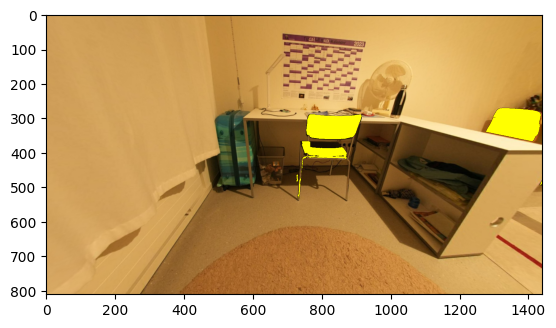

In [100]:
failure_image_file = image_files[8]

failure_image = cv2.imread(os.path.join(images_path, failure_image_file))
failure_image = cv2.cvtColor(failure_image, cv2.COLOR_BGR2RGB)

gt_mask_all = np.load(os.path.join(masks_path, mask_files[8]))

gt_mask = (gt_mask_all==8)

mg_mask = find_mask_with_grid(600, generate_random_grid)(failure_image, text_emb, 0.3)
# iou_s.append(compute_iou(mg_mask, gt_mask))

plt.imshow(failure_image)
show_mask(gt_mask, plt.gca(), color=[1.0, 1.0, 0, 1.0])
plt.show()

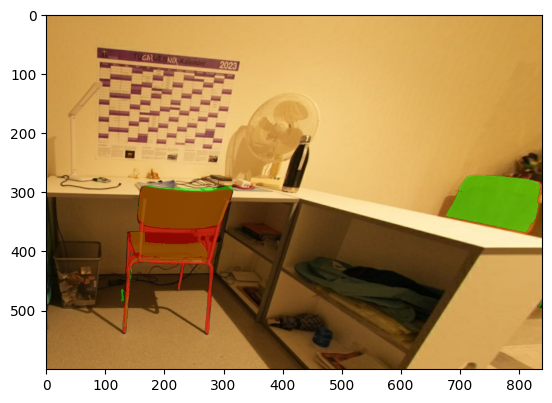

In [109]:
crop_ = lambda x: x[:600, 600:]
plt.imshow(crop_(failure_image))
show_mask(crop_(gt_mask), plt.gca(), color=[0.0, 1.0, 0, 0.5])
show_mask(crop_(mg_mask), plt.gca(), color=[1.0, 0.0, 0, 0.5])
plt.show()

So we didnot recognize back of the second chair

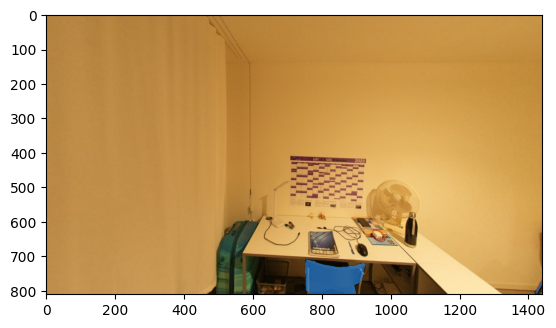

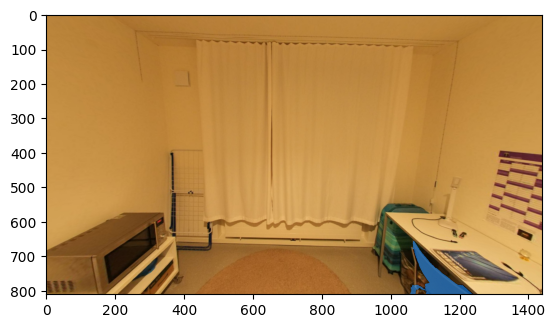

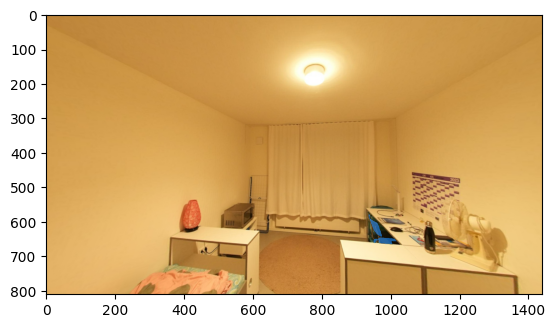

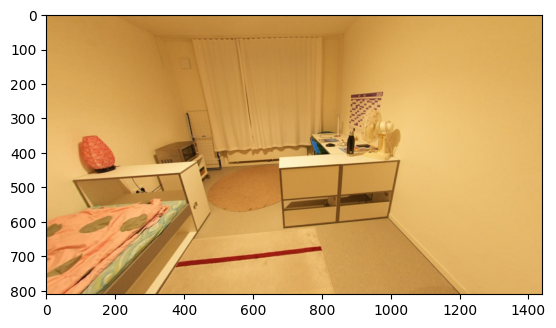

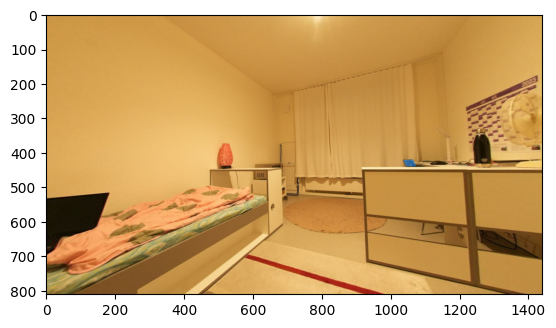

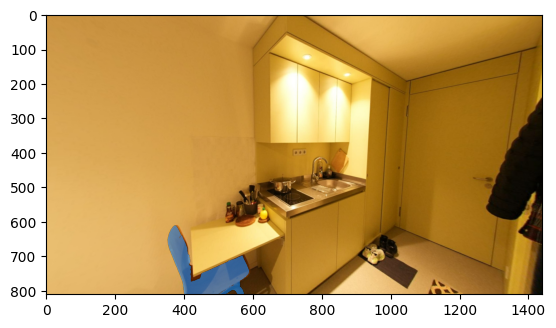

In [77]:
for ind in present_ious_grid_600_failure:
    failure_image_file = image_files[ind]

    failure_image = cv2.imread(os.path.join(images_path, failure_image_file))
    failure_image = cv2.cvtColor(failure_image, cv2.COLOR_BGR2RGB)

    gt_mask_all = np.load(os.path.join(masks_path, mask_files[ind]))

    gt_mask = (gt_mask_all==8)
    
    # mg_mask = find_mask_with_grid(600, generate_random_grid)(failure_image, text_emb, 0.3)
    # iou_s.append(compute_iou(mg_mask, gt_mask))

    plt.imshow(failure_image)
    show_mask(gt_mask, plt.gca())
    plt.show()

Same here, besides some chairs are behind obstacles

### Visulize the IOU

In [85]:
im_id = 2
iou_image_file = image_files[im_id]
iou_image = cv2.imread(os.path.join(images_path, iou_image_file))
iou_image = cv2.cvtColor(iou_image, cv2.COLOR_BGR2RGB)


iou_gt_mask = np.load(os.path.join(masks_path, mask_files[im_id]))==8
print(image_file)

DSC05847.JPG


In [86]:
mask_for_iou = find_mask_with_grid(600, generate_random_grid)(iou_image, text_emb)

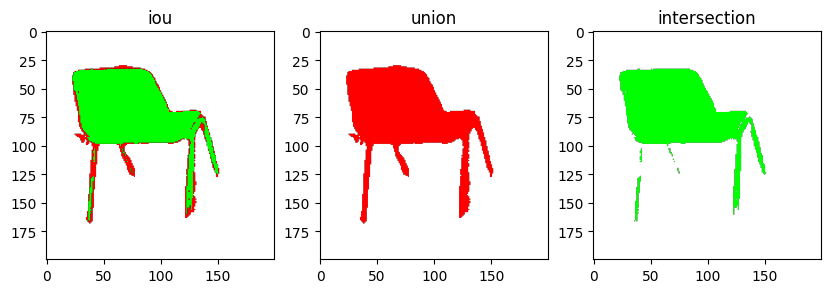

In [134]:
crop_ = lambda x: x[400:600, 380:580]
U = np.logical_or(crop_(mask_for_iou), crop_(iou_gt_mask))
I = np.logical_and(crop_(mask_for_iou), crop_(iou_gt_mask))
B = np.ones(shape=(U.shape[0], U.shape[1], 3))

plt.figure(figsize=(10, 3))
plt.subplot(1, 3, 1)
plt.title("iou")
plt.imshow(B)
show_mask(U, plt.gca(), color=[1.0, 0.0, 0.0, 1])
show_mask(I, plt.gca(), color = [0.0, 1.0, 0.0, 1])
plt.subplot(1, 3, 2)
plt.title("union")
plt.imshow(B)
show_mask(U, plt.gca(), color=[1.0, 0.0, 0.0, 1])
# show_mask(I, plt.gca(), color = [0.0, 1.0, 0.0, 0.5])
plt.subplot(1, 3, 3)
plt.title("intersection")
plt.imshow(B)
# show_mask(U, plt.gca(), color=[1.0, 0.0, 0.0, 1])
show_mask(I, plt.gca(), color = [0.0, 1.0, 0.0, 1])

### Investigate how prompt, mask size, proportion of background affect the performance.

In [48]:
prompt_back = clip_model.encode_text(clip.tokenize("chair back").to(device))

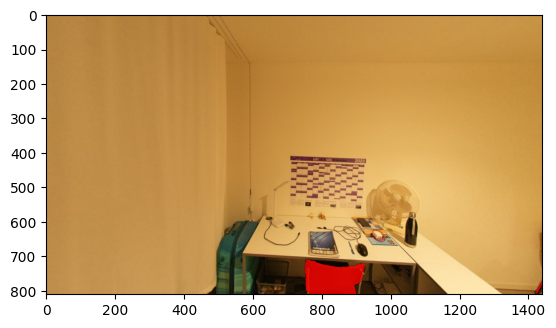

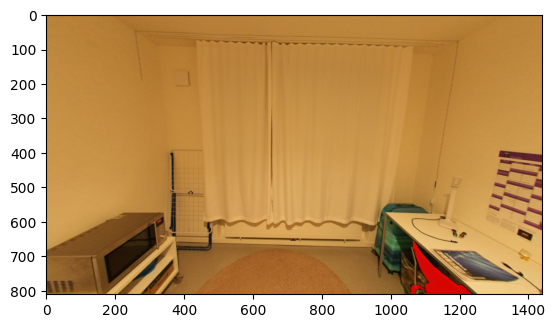

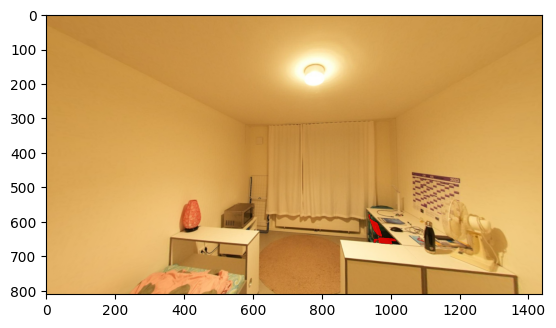

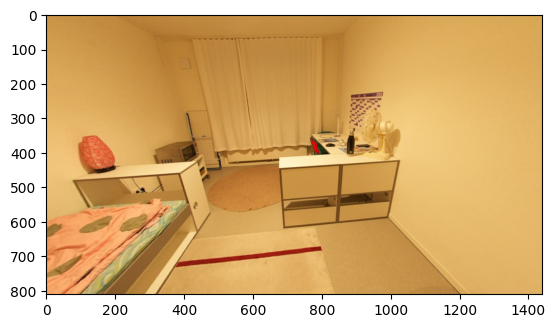

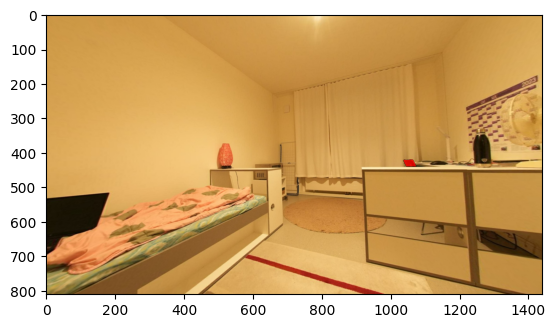

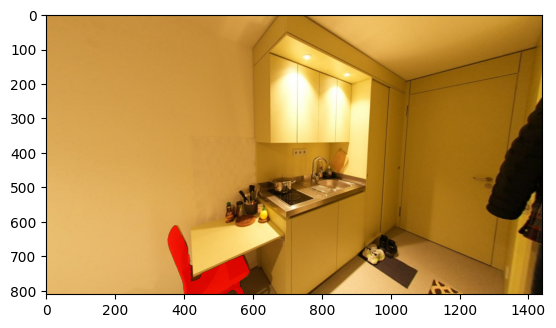

In [54]:
back_ious = []
for ind in present_ious_grid_600_failure:
    failure_image_file = image_files[ind]

    failure_image = cv2.imread(os.path.join(images_path, failure_image_file))
    failure_image = cv2.cvtColor(failure_image, cv2.COLOR_BGR2RGB)
    plt.imshow(failure_image)
    gt_mask_all = np.load(os.path.join(masks_path, mask_files[ind]))

    gt_mask = (gt_mask_all==8)
    
    mg_mask = find_mask_with_grid(600, generate_random_grid)(failure_image, prompt_back, 0.3)
    back_ious.append(compute_iou(mg_mask, gt_mask))

    
    show_mask(gt_mask, plt.gca(), color=[1, 0, 0, 0.8])
    show_mask(mg_mask, plt.gca(), color=[0, 1, 0, 0.8])
    plt.show()
    

## Explore on backpack

In [282]:
bp_emb = clip_model.encode_text(clip.tokenize("backpack").to(device))

In [268]:
mIOU_grid_table600, present_ious_table_600 = evaluate_mask_finder(image_files, find_mask_with_grid(500, generate_random_grid, mask_sz=2), class_index=67, text_emb=bp_emb, threshold=0.27)

100%|██████████| 35/35 [18:39<00:00, 31.97s/it]


In [271]:
print(mIOU_grid_table600)
print(f"Uniform grid, 500 samples, backpack \nmean={mIOU_grid_table600:.3f}, mean on images w backpack={np.array(present_ious_table_600).mean(axis=0)[0]:.3f}")

0.7550697689497783
Uniform grid, 500 samples, backpack 
mean=0.755, mean on images w backpack=0.312


In [275]:
present_ious_table_600 = np.array(present_ious_table_600)

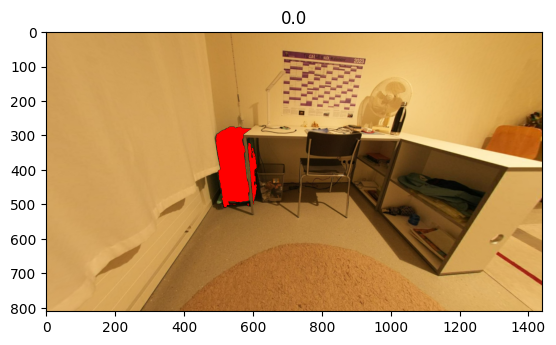

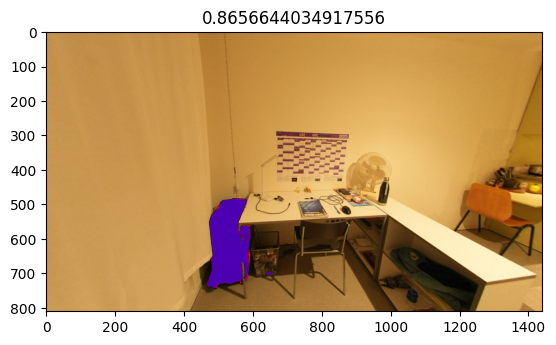

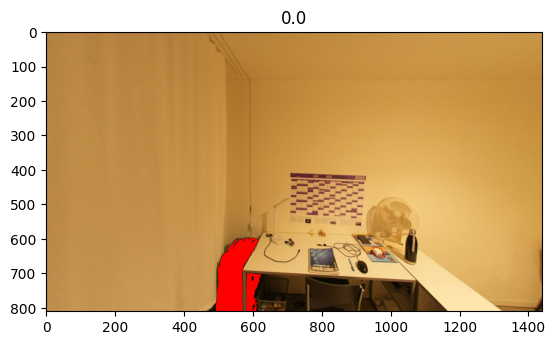

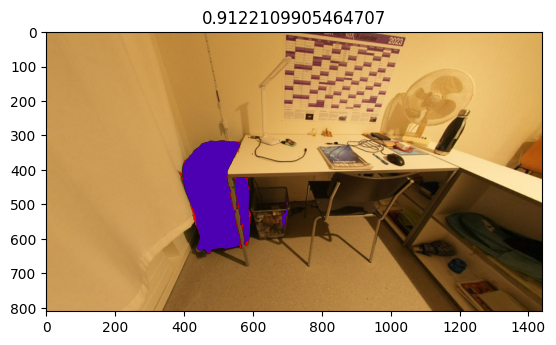

In [283]:
for ind in present_ious_table_600[1:5, 1]:
    failure_image_file = image_files[int(ind)]

    failure_image = cv2.imread(os.path.join(images_path, failure_image_file))
    failure_image = cv2.cvtColor(failure_image, cv2.COLOR_BGR2RGB)
    plt.imshow(failure_image)
    gt_mask_all = np.load(os.path.join(masks_path, mask_files[int(ind)]))

    gt_mask = (gt_mask_all==67)
    
    mg_mask = find_mask_with_grid(500, generate_random_grid, 2)(failure_image, bp_emb, 0.27)
    back_ious.append(compute_iou(mg_mask, gt_mask))

    
    U = np.logical_or(gt_mask, mg_mask)
    I = np.logical_and(gt_mask, mg_mask)
    
    
    show_mask(U, plt.gca(), color=[1.0, 0.0, 0.0, 1.0])
    # 
    show_mask(mg_mask, plt.gca(), color=[0, 0.0, 1.0, 0.7])
    plt.title(compute_iou(mg_mask, gt_mask))
    plt.show()
    

## Table

In [273]:
table_emb = clip_model.encode_text(clip.tokenize("table").to(device))

[-100    0    1    2    3    4    7    8   10   18   19   25   30   47
   49   54   67   68   70   98  106  118  122  296  297  301  342  345
  354  360  368  389  555  707 1637]
0.7592485137783422


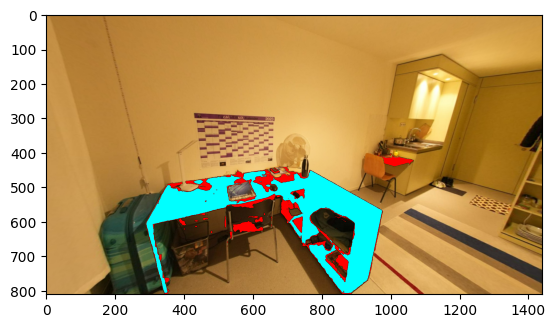

In [227]:
ind_table = 7
table_image_file = image_files[ind_table]

table_image = cv2.imread(os.path.join(images_path, table_image_file))
table_image = cv2.cvtColor(table_image, cv2.COLOR_BGR2RGB)
plt.imshow(table_image)

gt_mask_all = np.load(os.path.join(masks_path, mask_files[ind_table]))
print(np.unique(gt_mask_all))
gt_mask = (gt_mask_all==4)
# plt.imshow(gt_mask)
# print(gt_mask.sum())
mg_mask = find_mask_with_grid(600, generate_random_grid, 2)(table_image, text_emb, 0.29)
print(compute_iou(mg_mask, gt_mask))

U = np.logical_or(gt_mask, mg_mask)
I = np.logical_and(gt_mask, mg_mask)


show_mask(U, plt.gca(), color=[1.0, 0.0, 0.0, 1.0])
# 
show_mask(I, plt.gca(), color=[0, 1.0, 1.0, 1.0])

plt.show()

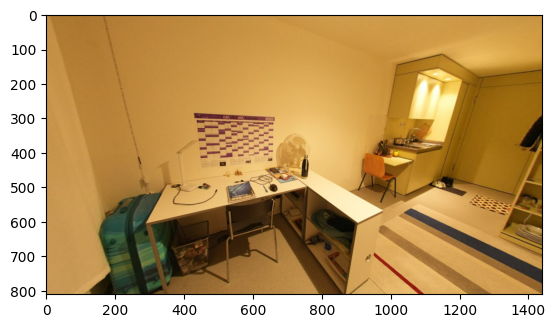

In [181]:
ind_table = 7
table_image_file = image_files[ind_table]

table_image = cv2.imread(os.path.join(images_path, table_image_file))
table_image = cv2.cvtColor(table_image, cv2.COLOR_BGR2RGB)
plt.imshow(table_image)


[-100    0    1    2    3    4    7    8   10   18   19   25   30   47
   49   54   67   68   70   98  106  118  122  296  297  301  342  345
  354  360  368  389  555  707 1637]
0.7667790813660761


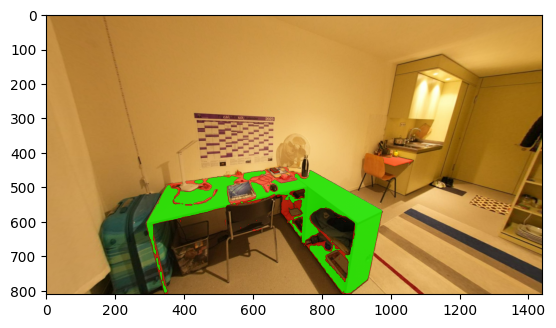

In [185]:
plt.imshow(table_image)

gt_mask_all = np.load(os.path.join(masks_path, mask_files[ind_table]))
print(np.unique(gt_mask_all))
gt_mask = (gt_mask_all==4)
# plt.imshow(gt_mask)
# print(gt_mask.sum())
mg_mask = find_mask_with_grid(600, generate_random_grid)(table_image, text_emb, 0.283)
print(compute_iou(mg_mask, gt_mask))


U = np.logical_or(gt_mask, mg_mask)
I = np.logical_and(gt_mask, mg_mask)


show_mask(U, plt.gca(), color=[1.0, 0.0, 0.0, 0.5])
# 
show_mask(I, plt.gca(), color=[0, 1.0, 0, 0.8])
plt.show()

In [186]:
point = np.array([[400, 530]])
labels = np.ones(shape=(len(point)))

In [201]:
masks, _, _ = sam_predictor.predict(point, labels, multimask_output=True)

In [213]:
mask = masks[1, :, :]

0.34532879516467013


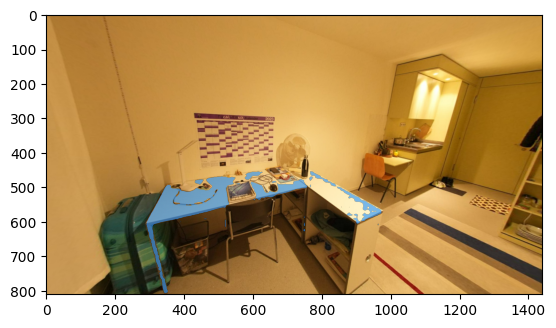

In [214]:
plt.imshow(table_image)
show_mask(mask, plt.gca())
print(compute_iou(mask, gt_mask))
plt.show()


In [175]:
compute_iou(masks, gt_mask)

0.46653156178050653

0


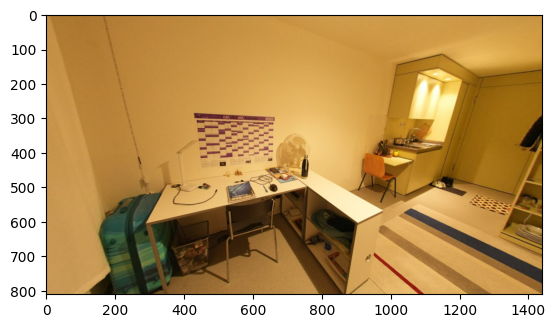

In [114]:
plt.imshow(table_image)
print(mg_mask.sum())

# show_mask(mg_mask, plt.gca(), color=[0, 1.0, 0, 0.8])

In [140]:
chair_emb = clip_model.encode_text(clip.tokenize("chair").to(device))

In [135]:
mIOU_grid_600_029

0.40747440324866985

In [141]:
mIOU_grid_600_2, present_ious_grid_600_2 = evaluate_mask_finder(image_files, find_mask_with_grid(600, generate_random_grid), text_emb=chair_emb, threshold= 0.3, class_index=8)

100%|██████████| 35/35 [21:09<00:00, 36.28s/it]


In [143]:

print(mIOU_grid_600_2)

0.7169870715250783


In [139]:
present_ious_grid_400 = np.array(present_ious_grid_400)
present_ious_grid_400


array([[ 0.        ,  2.        ],
       [ 0.88439056,  3.        ],
       [ 0.        ,  6.        ],
       [ 0.58191283,  7.        ],
       [ 0.42099805,  8.        ],
       [ 0.81621132,  9.        ],
       [ 0.        , 10.        ],
       [ 0.66545186, 11.        ],
       [ 0.71850857, 12.        ],
       [ 0.        , 13.        ],
       [ 0.        , 15.        ],
       [ 0.        , 16.        ],
       [ 0.        , 17.        ],
       [ 0.        , 21.        ],
       [ 0.67892318, 22.        ]])

In [140]:
present_ious_grid_400.mean(axis=0)

array([ 0.31775976, 11.46666667])

15.0


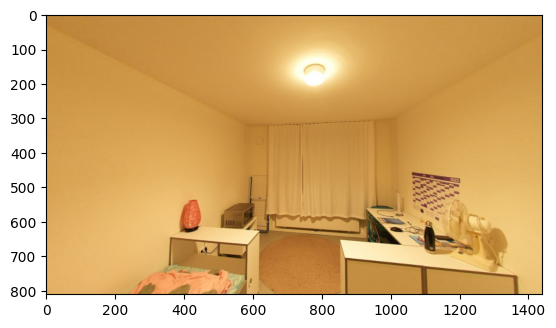

In [202]:
for i in present_ious_grid_step30[10:]:
    if i[0] == 0:
        image_file = image_files[int(i[1])]
        print(i[1])
        image_broken = cv2.imread(os.path.join(images_path, image_file))
        image_broken = cv2.cvtColor(image_broken, cv2.COLOR_BGR2RGB)
        plt.imshow(image_broken)
        break

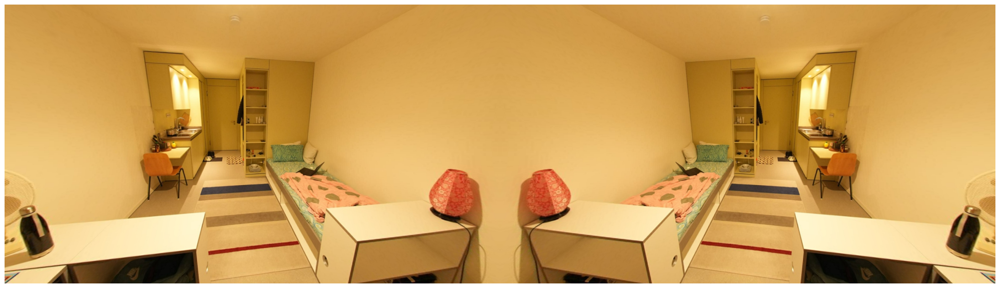

In [150]:
plt.figure(figsize=(28, 8))
plt.axis("off")
plt.imshow(image)
# show_mask(m[0], plt.gca())
# show_points(M[m], np.ones(len(match_idx)), plt.gca())

[150 169]


In [136]:
point_best = M[matching_indexes]
label_best = np.ones(len(point_best))
print(point_best.shape, label_best.shape)
print(point_best)
print(point_best[0])
# print(matching_indexes)

(2, 2) (2,)
[[ 500  500]
 [2400  500]]
[500 500]


In [137]:
masks, _, _ = sam_predictor.predict(point_best, label_best, multimask_output=False)

In [138]:
print(masks.shape)
masks = masks.squeeze(0)
print(masks.shape)
instance = masks[:, :, None]*image

(1, 811, 2880)
(811, 2880)


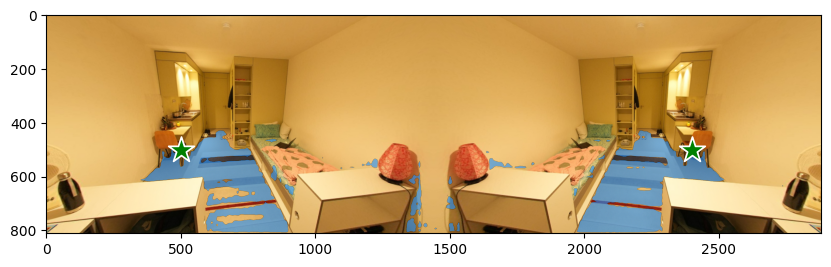

In [139]:
plt.figure(figsize=(10, 7))
plt.imshow(image)

for pb in point_best:

  show_points(pb, 1, plt.gca())
show_mask(masks, plt.gca())

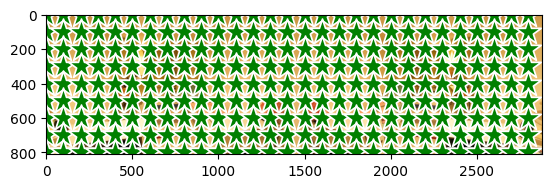

In [140]:
plt.imshow(image)
show_points(M, np.ones(len(M)), plt.gca())

In [ ]:
sam_predictor.set_image(image)


In [ ]:
input_point = np.array([[1300, 375]])
input_label = np.array([1])

In [ ]:
masks, _, _ = sam_predictor.predict(point_coords=input_point,
    point_labels=input_label,
    multimask_output=True)
masks.shape

(3, 811, 1440)

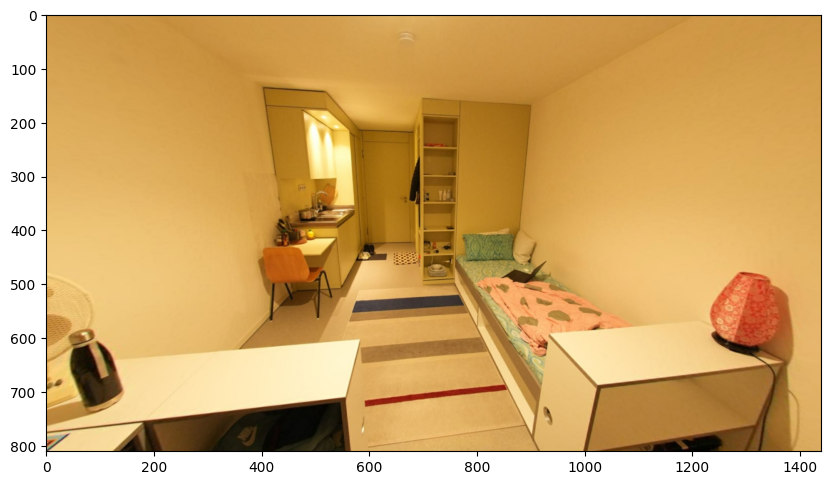

In [ ]:
plt.figure(figsize=(10, 7))
plt.imshow(image)
show_mask(masks[0], plt.gca(), True)

In [ ]:
input_label = np.array([1])

(1, 2)


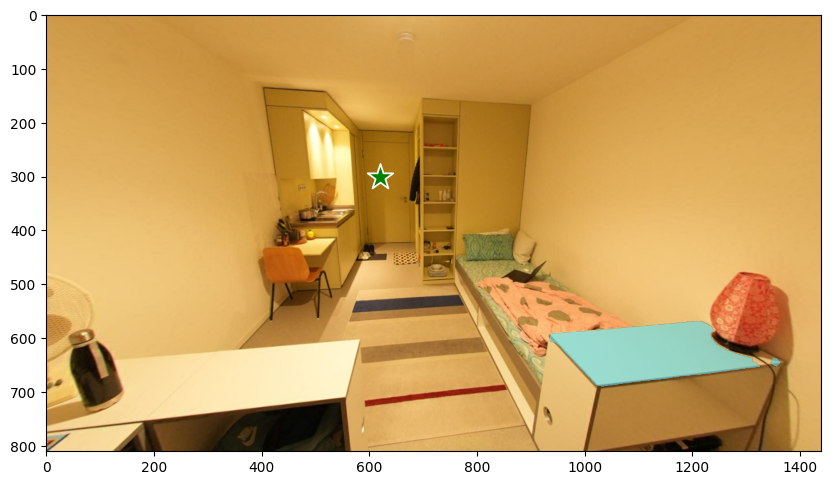

In [ ]:
point_door = np.array([[620, 300]])
print(point_door.shape)

plt.figure(figsize=(10, 7))
plt.imshow(image)
show_points(point_door, input_label, plt.gca())
show_mask(masks[0], plt.gca(), True)